# Лабораторная работа 6.

# Cегментация изображений


В этой работе рассматриваются методы сегментации изображений.

Цель лабораторной работы: научиться применять методы сегментации изображений.

#
Настроим Jupyter на отображение полного интерактивного вывода:

#
from IPython.core.interactiveshell import InteractiveShell

InteractiveShell.ast_node_interactivity = "all"

### Дополнительные библиотеки

- https://scikit-learn.org/stable/
- conda install -c anaconda scikit-learn

- https://scikit-image.org/
- conda install -c anaconda scikit-image

In [ ]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


In [1]:
import sys
sys.path.append('../')
import numpy as np
import cv2 as cv
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.cluster import KMeans
from skimage.feature import peak_local_max
from skimage.segmentation import watershed
from skimage import data
from scipy import ndimage
import matplotlib.pyplot as plt
from utility import segmentation_utils


### Загрузим изображение

In [3]:
image = cv.imread(r'C:\Users\79023\Desktop\lab\images\image.png')
image_hsv = cv.cvtColor(image, cv.COLOR_RGB2HSV)
gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

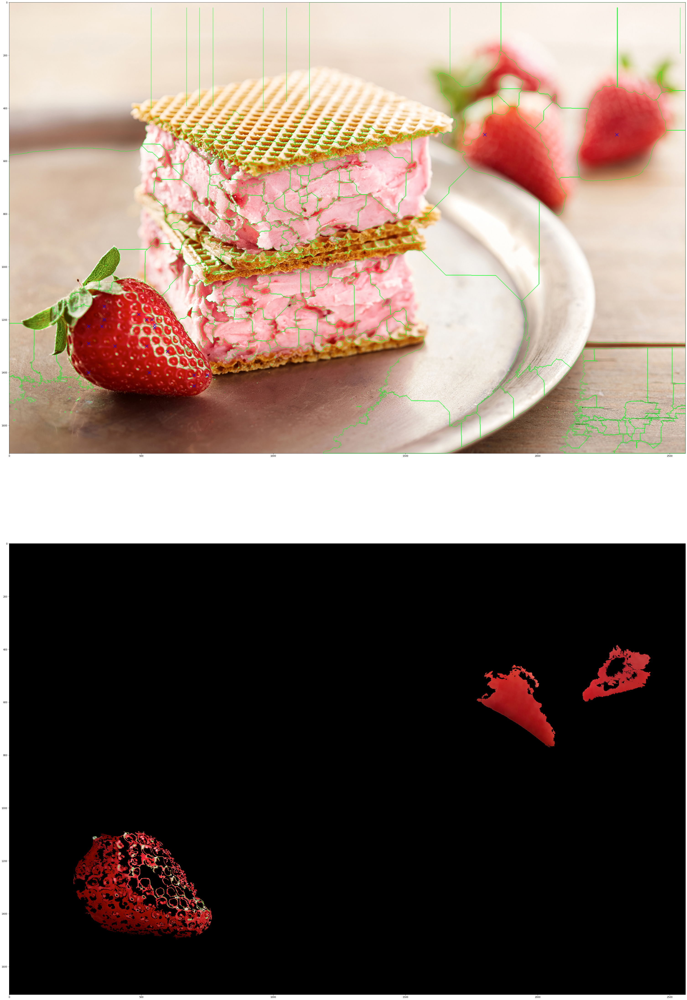

In [155]:

# определяем координаты начальных точек
#seeds = [(1150, 250), (1000, 360), (1225, 300), (1300, 600),(1400, 600),(1400, 300),(500, 1800), (500, 2300) ]
seeds = [ (1225, 300), (1225, 350), (1150, 360), (500, 1800), (500, 2300),
         (1200, 360), (1300, 520),(1290, 300), (1300, 400), (1400, 530),
         (1180, 490),(1400, 300), (1410, 750), (1410, 700), (1450, 700),
         (1200,520), (1200,540), (1220,550), (1230,550), (1320, 600)  ]
# координаты для графика
x = list(map(lambda x: x[1], seeds))
y = list(map(lambda x: x[0], seeds))
# порог похожести цвета региона
threshold = 86 #86
# находим сегментацию используя метод из segmentation_utils
segmented_region = segmentation_utils.region_growingHSV(image_hsv, seeds, threshold)
# накладываем маску - отображаем только участки попавшие в какой-либо сегмент
result = cv.bitwise_and(image, image, mask=segmented_region)
# отображаем полученное изображение
plt.figure(figsize=(60,80))
plt.subplot(2, 1, 1)
plt.scatter(x, y, marker="x", color="blue", s=200)
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
plt.subplot(2, 1, 2)
plt.imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
plt.show()

In [103]:
cv.imwrite('result.jpg', image)

True

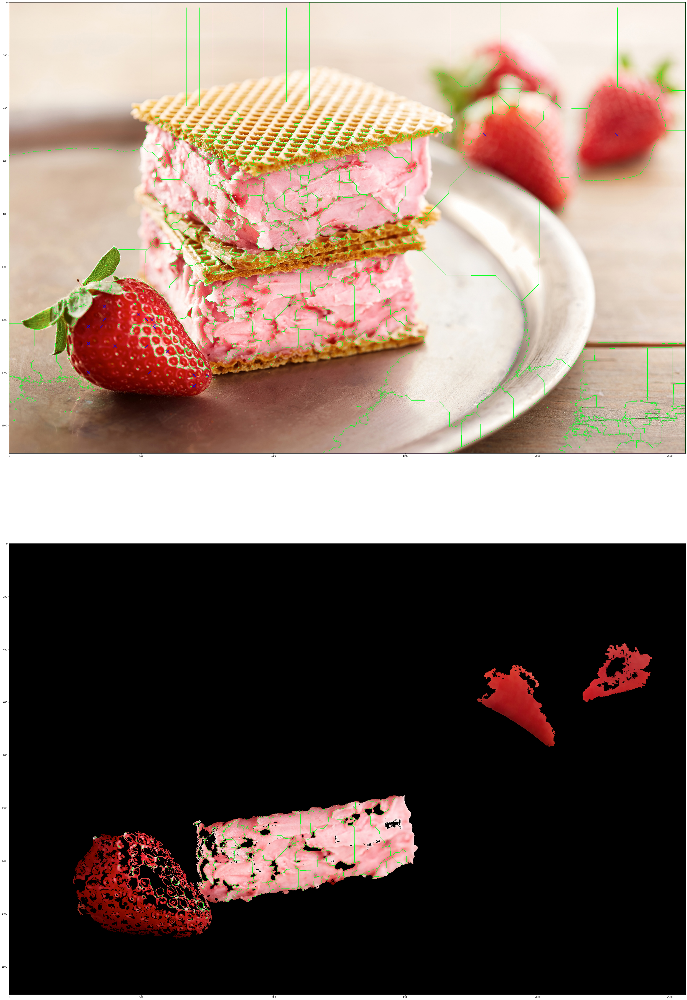

In [156]:

# сравним результаты с порогом = 86.5
#seeds = [(1150, 250), (1000, 360), (1225, 300), (1300, 600),(1400, 600),(1400, 300),(500, 1800), (500, 2300) ]
seeds = [ (1225, 300), (1225, 350), (1150, 360), (500, 1800), (500, 2300),
         (1200, 360), (1300, 520),(1290, 300), (1300, 400), (1400, 530),
         (1180, 490),(1400, 300), (1410, 750), (1410, 700), (1450, 700),
         (1200,520), (1200,540), (1220,550), (1230,550), (1320, 600)  ]
# координаты для графика
x = list(map(lambda x: x[1], seeds))
y = list(map(lambda x: x[0], seeds))
# порог похожести цвета региона
threshold = 86.5 #86
# находим сегментацию используя метод из segmentation_utils
segmented_region = segmentation_utils.region_growingHSV(image_hsv, seeds, threshold)
# накладываем маску - отображаем только участки попавшие в какой-либо сегмент
result = cv.bitwise_and(image, image, mask=segmented_region)
# отображаем полученное изображение
plt.figure(figsize=(60,80))
plt.subplot(2, 1, 1)
plt.scatter(x, y, marker="x", color="blue", s=200)
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
plt.subplot(2, 1, 2)
plt.imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
plt.show()